# Tiger in Fraunhofer mode (take 2)
*A. Bolton, 2023 May*

This notebook uses Poppy's Fraunhofer mode to generate a more well-sampled simulation
of the micropupil image formed by a square Tiger microlens.

Relative to previous calculations, this version remains stable throughout the transition
between the microlens-diffraction-dominated regime and the geometric-pupil-dominated regime.

For simplicity, this notebook doesn't implement any downstream elements
(diaphragm, spectrograph, etc.).

Common assumptions across all variations in this notebook:
 * 6.5m primary w/ central obscuration and three supports
 * 700 $\mu$m square lenslet
 * 7 mm lenslet focal length (i.e., f/10)

Micropupil images (which are the basis for the spectrograph PSF) are calculated for a range of input
telescope plate scales corresponding to angular spaxel scales of 10, 20, 40, and 80 milliarcsec.
Calculations are done for a range of wavelengths between 0.4 and 1.7 $\mu$m, and for the following
three positions of the telescope PSF relative to the spaxel/microlens:
 * Telescope PSF centered on spaxel
 * Telescope PSF offset in x by one-half spaxel (centered on spaxel side boundary)
 * Telescope PSF offset in both x and y by one-half spaxel (centered on spaxel corner)

The figures below are:
 * Log-scale micropupil images which encode the fraction of counts remaining at lower surface brightness levels
 * Linear-scale micropupil images with colormap clipped at the half-maximum brightness level
 * Plots of ensquared energy versus square size

One take-away from these calculations is that 10, 20, and maybe 40 milliarcsec samplings give micropupil images
that appear compact and predictable enough to use as the basis for a forward-modeling extraction. 80 milliarcsec
appears more challenging.

Note that the images below are overresolved compared to the expected 10 $\mu$m detector pixel sampling.

In [1]:
# Imports:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import poppy
from poppy.poppy_core import PlaneType
#from poppy.sub_sampled_optics import Subapertures, ShackHartmannWavefrontSensor
import astropy.units as u
import astropy.io.fits as fits
import copy
#from astropy.table import Table, QTable
import skimage.measure

In [2]:
class TigerSystem:
    def __init__(self,
                 diam=6.5*u.m,
                 sec_rad=0.65*u.m,
                 n_supp=3,
                 supp_wid=0.15*u.m,
                 spaxel_arcsec=0.040,
                 pupil_factor=2,
                 npix=2048,
                 oversample=2,
                 spaxel_size=700.e-6*u.m,
                 spaxel_fratio=10.):
    # Stuff that gets specified:
        self.diam = diam
        self.sec_rad = sec_rad
        self.n_supp = n_supp
        self.supp_wid = supp_wid
        self.spaxel_arcsec = spaxel_arcsec
        self.pupil_factor = pupil_factor
        self.npix = npix
        self.oversample = oversample
        self.spaxel_size = spaxel_size
        self.spaxel_fratio = spaxel_fratio
    # Stuff that gets computed:
        # Spaxel focal length:
        self.spaxel_flength = self.spaxel_fratio * self.spaxel_size
        # Computational pupil diameter:
        self.pupil_diam = self.pupil_factor * self.diam
        # Implied telescope focal length:
        self.fl_pri = self.spaxel_size / (self.spaxel_arcsec / 206265.)
        # Implied micropupil demagnification:
        self.microp_mu = self.spaxel_flength / self.fl_pri
        # Physical half-width of simulated microimage:
        self.m_hw = (0.5 * self.microp_mu * self.pupil_diam * self.oversample).to(u.micron).value
    # Build model:
        self.osys = poppy.OpticalSystem(pupil_diameter=self.pupil_diam,
                                        npix=self.npix,
                                        oversample=self.oversample)
        prim_ap = poppy.CircularAperture(radius=self.diam/2.)
        ttstage = poppy.TipTiltStage(prim_ap, radius=self.diam/2.)
        self.osys.add_pupil(ttstage, name='Primary aperture')
        self.osys.add_pupil(poppy.SecondaryObscuration(secondary_radius=self.sec_rad,
                                                       n_supports=self.n_supp,
                                                       support_width=self.supp_wid))
        self.osys.add_image(poppy.ScalarTransmission(planetype=PlaneType.image, name='Telescope focal plane'))
        self.osys.add_image(poppy.SquareFieldStop(size=spaxel_arcsec, name='Tiger MLA aperture'))
        self.osys.add_pupil(poppy.ScalarTransmission(planetype=PlaneType.pupil, name='Far-field pupil'))

In [3]:
# Function to compute cumulative fraction of counts down to given surface brightness:
def cfrac_counts(image, minfrac=0.):
    outimg = image.ravel().copy()
    outshp = image.shape
    srt = np.flip(np.argsort(outimg))
    csum = outimg[srt].cumsum() / outimg.sum()
    outimg[srt] = np.maximum(1. - csum, minfrac)
    outimg.resize(outshp)
    return(outimg)

In [4]:
# PSF plotting function
def plot_psf_stack(test_lam, psf_stack, m_hw, ftitle, logscale=True):
# Make unbinned plot:
    n_x = 3
    n_y = 5
    fig, axis = plt.subplots(n_y, n_x)#, sharex=True, sharey=True)
    for k in range(len(test_lam)):
        i = k % n_x
        j = k // n_x
        axis[j,i].set_box_aspect(1)
        if logscale:
            disp_image = cfrac_counts(psf_stack[k].intensity, minfrac=1.e-10)
            ax = axis[j,i].imshow(np.log10(disp_image), vmin=-4, vmax=0, cmap='magma', origin='lower', interpolation='nearest',
                                  extent=(-m_hw,m_hw,-m_hw,m_hw))
        else:
            disp_image = psf_stack[k].intensity / psf_stack[k].intensity.max()
            ax = axis[j,i].imshow(disp_image, vmin=0., vmax=0.5, cmap='magma', origin='lower', interpolation='nearest',
                                  extent=(-m_hw,m_hw,-m_hw,m_hw))
        axis[j,i].set_xlim([-60,60])
        axis[j,i].set_ylim([-60,60])
        axis[j,i].set_title('$\lambda$='+test_lam[k].to_string(format='latex', precision=2))

    #axis[3,2].axis('off')
    #axis[3,3].axis('off')
    axis[4,2].axis('off')

    fig.set_figwidth(12)
    fig.set_figheight(18)
    fig.suptitle(ftitle, y=.92)
    fig.subplots_adjust(right=0.8)
    cbar_ax = fig.add_axes([0.85, 0.25, 0.03, 0.5])
    fig.colorbar(ax, cax=cbar_ax)
    return

In [38]:
def calc_ensq(im):
    # Simple function to compute ensquared energy for square image
    # im = square input image
    ny, nx = im.shape
    if (ny != nx):
        print("Image must be square")
        return(0)
# 1D image baseline for "what is the smallest square I am in?"
    sqbase = abs(2*np.arange(nx) - nx + 1) + 1
# 2D version of same question (a "bounding-square" coordinate image):
    x_im = np.outer(sqbase, np.full(nx, 1))
    sq_coord = np.maximum(x_im, x_im.T)
# Sort the flattened bounding-square image,
# apply that sort to the data image as well,
# and compute cumulative sum:
    srt = np.argsort(sq_coord.ravel())
    fullbase = sq_coord.ravel()[srt]
    fulldata = im.ravel()[srt]
    fullsum = fulldata.cumsum()
# Downselect to sums fully within squares:
    u_base, u_idx, u_num = np.unique(fullbase, return_index=True, return_counts=True)
    u_idx_2 = u_idx + u_num - 1
    sub_sum = fullsum[u_idx_2]
    return(u_base, sub_sum)

In [6]:
# Initialize systems with range of spaxel scales:
tigersys_10 = TigerSystem(spaxel_arcsec=0.01, pupil_factor=20)
tigersys_20 = TigerSystem(spaxel_arcsec=0.02, pupil_factor=20)
tigersys_40 = TigerSystem(spaxel_arcsec=0.04, pupil_factor=20)
tigersys_80 = TigerSystem(spaxel_arcsec=0.08, pupil_factor=20)

In [7]:
# Compute centered PSFs as a function of wavelength
test_lam = [this_lam * u.micron for this_lam in np.linspace(.4,1.7,14)]

psf_stack_10 = []
psf_stack_20 = []
psf_stack_40 = []
psf_stack_80 = []

for this_lam in test_lam:
    print(this_lam)
    this_psf, this_wave = tigersys_10.osys.calc_psf(wavelength=this_lam, return_final=True)
    psf_stack_10.append(this_wave[0])
    this_psf, this_wave = tigersys_20.osys.calc_psf(wavelength=this_lam, return_final=True)
    psf_stack_20.append(this_wave[0])
    this_psf, this_wave = tigersys_40.osys.calc_psf(wavelength=this_lam, return_final=True)
    psf_stack_40.append(this_wave[0])
    this_psf, this_wave = tigersys_80.osys.calc_psf(wavelength=this_lam, return_final=True)
    psf_stack_80.append(this_wave[0])

0.4 micron
0.5 micron
0.6 micron
0.7 micron
0.8 micron
0.8999999999999999 micron
1.0 micron
1.1 micron
1.2 micron
1.2999999999999998 micron
1.4 micron
1.5 micron
1.6 micron
1.7 micron


In [8]:
# Compute x-offset PSFs as a function of wavelength

psf_stack_10_x = []
psf_stack_20_x = []
psf_stack_40_x = []
psf_stack_80_x = []

tigersys_10.osys[0].set_tip_tilt(0.5 * tigersys_10.spaxel_arcsec * u.arcsec,
                                 0.0 * tigersys_10.spaxel_arcsec * u.arcsec)
tigersys_20.osys[0].set_tip_tilt(0.5 * tigersys_20.spaxel_arcsec * u.arcsec,
                                 0.0 * tigersys_20.spaxel_arcsec * u.arcsec)
tigersys_40.osys[0].set_tip_tilt(0.5 * tigersys_40.spaxel_arcsec * u.arcsec,
                                 0.0 * tigersys_40.spaxel_arcsec * u.arcsec)
tigersys_80.osys[0].set_tip_tilt(0.5 * tigersys_80.spaxel_arcsec * u.arcsec,
                                 0.0 * tigersys_80.spaxel_arcsec * u.arcsec)

for this_lam in test_lam:
    print(this_lam)
    this_psf, this_wave = tigersys_10.osys.calc_psf(wavelength=this_lam, return_final=True)
    psf_stack_10_x.append(this_wave[0])
    this_psf, this_wave = tigersys_20.osys.calc_psf(wavelength=this_lam, return_final=True)
    psf_stack_20_x.append(this_wave[0])
    this_psf, this_wave = tigersys_40.osys.calc_psf(wavelength=this_lam, return_final=True)
    psf_stack_40_x.append(this_wave[0])
    this_psf, this_wave = tigersys_80.osys.calc_psf(wavelength=this_lam, return_final=True)
    psf_stack_80_x.append(this_wave[0])

0.4 micron
0.5 micron
0.6 micron
0.7 micron
0.8 micron
0.8999999999999999 micron
1.0 micron
1.1 micron
1.2 micron
1.2999999999999998 micron
1.4 micron
1.5 micron
1.6 micron
1.7 micron


In [9]:
# Compute xy-offset PSFs as a function of wavelength

psf_stack_10_xy = []
psf_stack_20_xy = []
psf_stack_40_xy = []
psf_stack_80_xy = []

tigersys_10.osys[0].set_tip_tilt(0.5 * tigersys_10.spaxel_arcsec * u.arcsec,
                                 0.5 * tigersys_10.spaxel_arcsec * u.arcsec)
tigersys_20.osys[0].set_tip_tilt(0.5 * tigersys_20.spaxel_arcsec * u.arcsec,
                                 0.5 * tigersys_20.spaxel_arcsec * u.arcsec)
tigersys_40.osys[0].set_tip_tilt(0.5 * tigersys_40.spaxel_arcsec * u.arcsec,
                                 0.5 * tigersys_40.spaxel_arcsec * u.arcsec)
tigersys_80.osys[0].set_tip_tilt(0.5 * tigersys_80.spaxel_arcsec * u.arcsec,
                                 0.5 * tigersys_80.spaxel_arcsec * u.arcsec)

for this_lam in test_lam:
    print(this_lam)
    this_psf, this_wave = tigersys_10.osys.calc_psf(wavelength=this_lam, return_final=True)
    psf_stack_10_xy.append(this_wave[0])
    this_psf, this_wave = tigersys_20.osys.calc_psf(wavelength=this_lam, return_final=True)
    psf_stack_20_xy.append(this_wave[0])
    this_psf, this_wave = tigersys_40.osys.calc_psf(wavelength=this_lam, return_final=True)
    psf_stack_40_xy.append(this_wave[0])
    this_psf, this_wave = tigersys_80.osys.calc_psf(wavelength=this_lam, return_final=True)
    psf_stack_80_xy.append(this_wave[0])

0.4 micron
0.5 micron
0.6 micron
0.7 micron
0.8 micron
0.8999999999999999 micron
1.0 micron
1.1 micron
1.2 micron
1.2999999999999998 micron
1.4 micron
1.5 micron
1.6 micron
1.7 micron


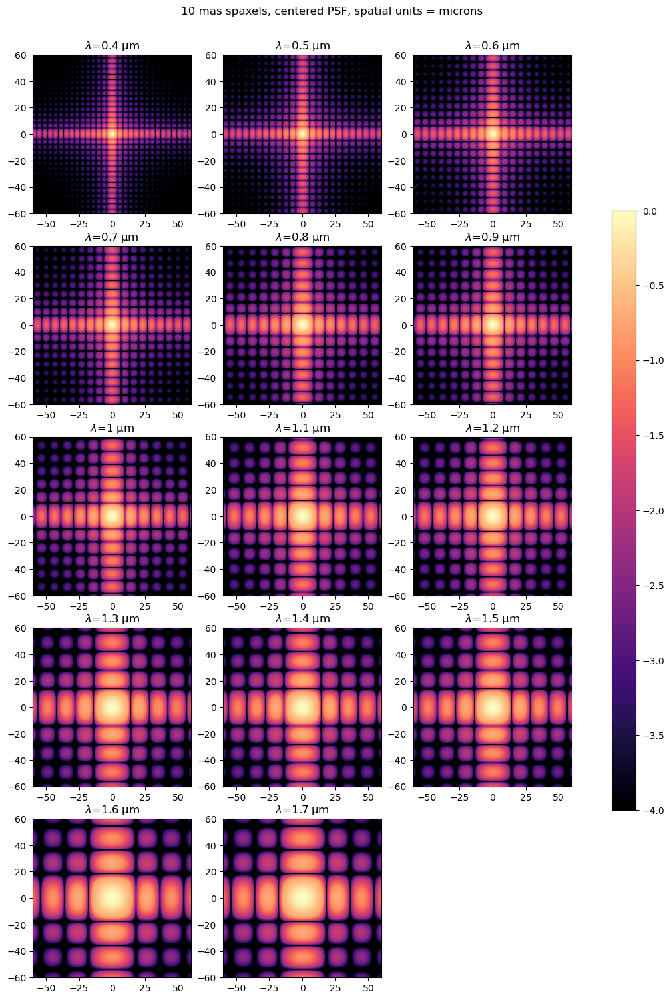

In [10]:
plot_psf_stack(test_lam, psf_stack_10, tigersys_10.m_hw, '10 mas spaxels, centered PSF, spatial units = microns')

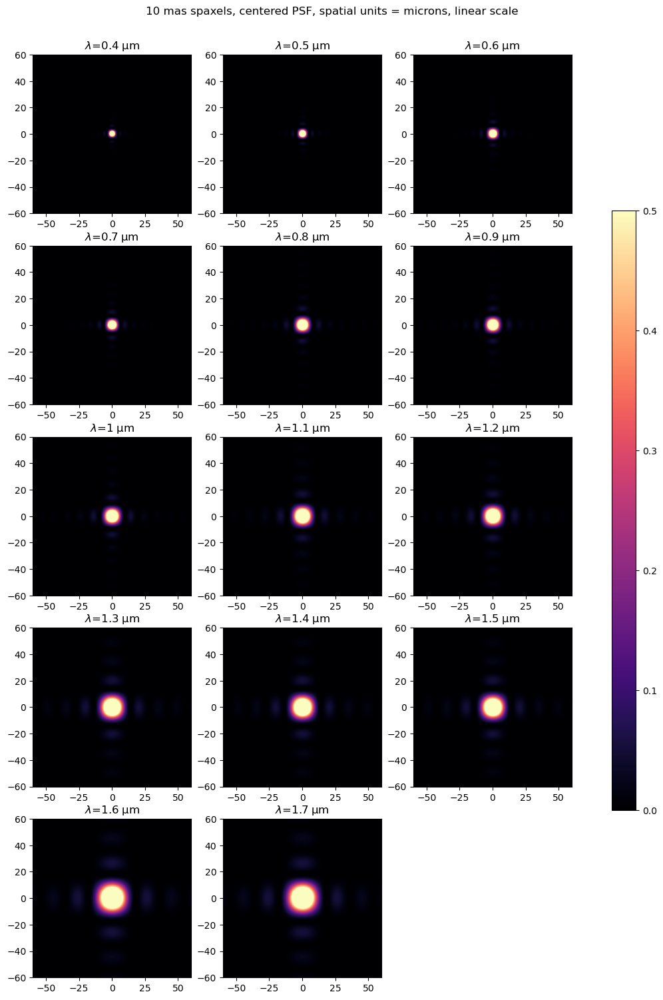

In [12]:
plot_psf_stack(test_lam, psf_stack_10, tigersys_10.m_hw,
               '10 mas spaxels, centered PSF, spatial units = microns, linear scale', logscale=False)

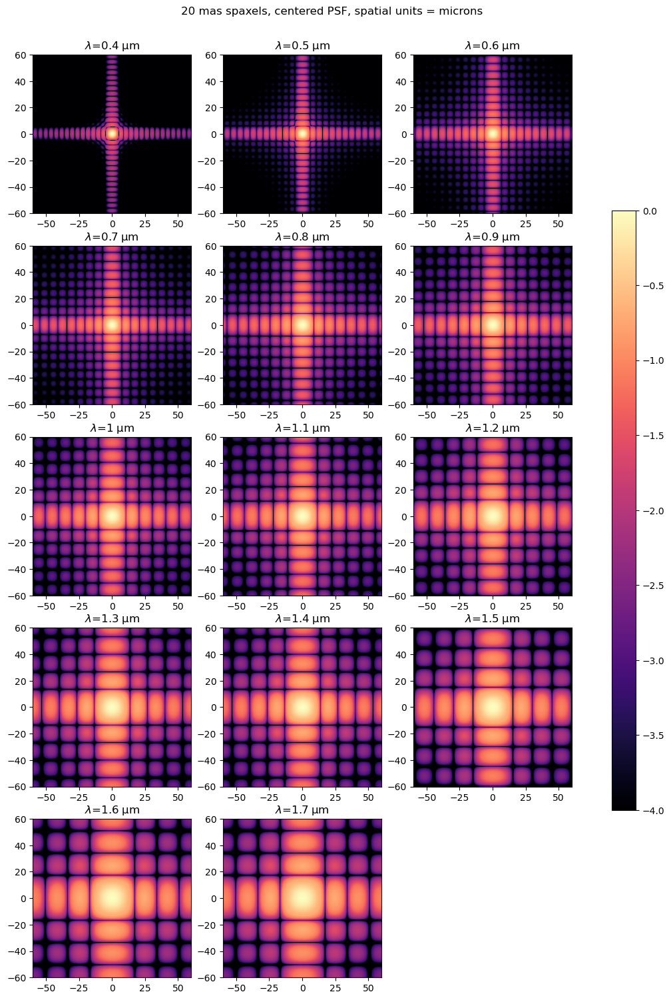

In [14]:
plot_psf_stack(test_lam, psf_stack_20, tigersys_20.m_hw, '20 mas spaxels, centered PSF, spatial units = microns')

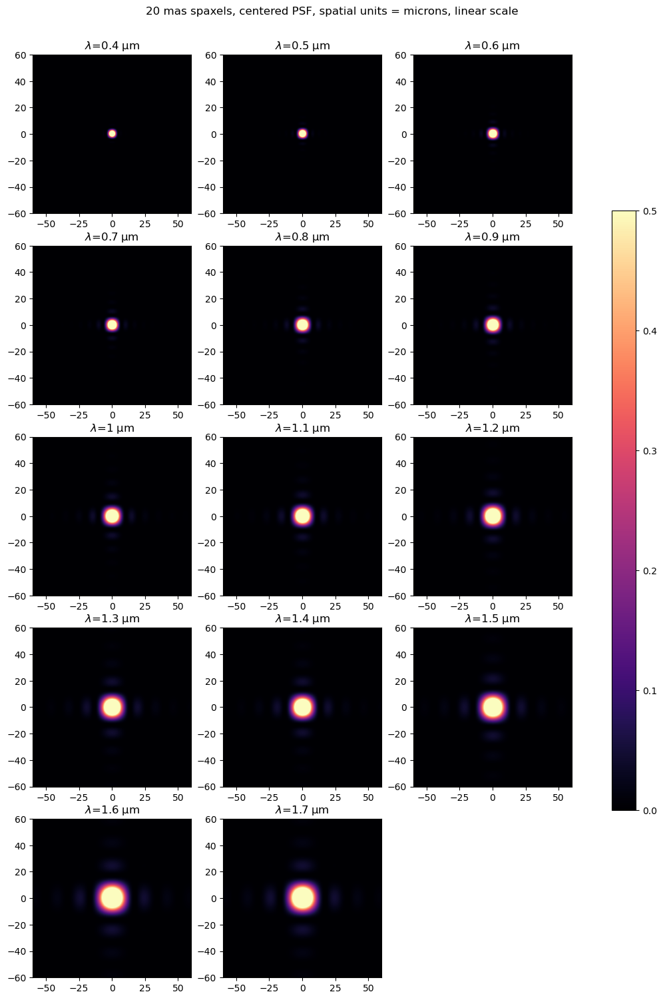

In [15]:
plot_psf_stack(test_lam, psf_stack_20, tigersys_20.m_hw,
               '20 mas spaxels, centered PSF, spatial units = microns, linear scale', logscale=False)

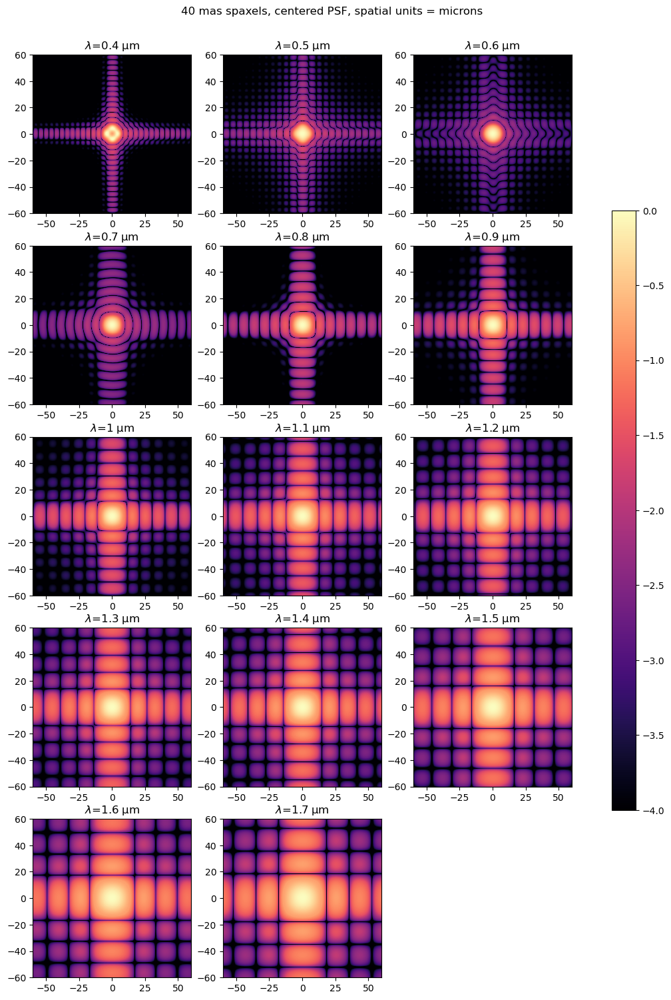

In [16]:
plot_psf_stack(test_lam, psf_stack_40, tigersys_40.m_hw, '40 mas spaxels, centered PSF, spatial units = microns')

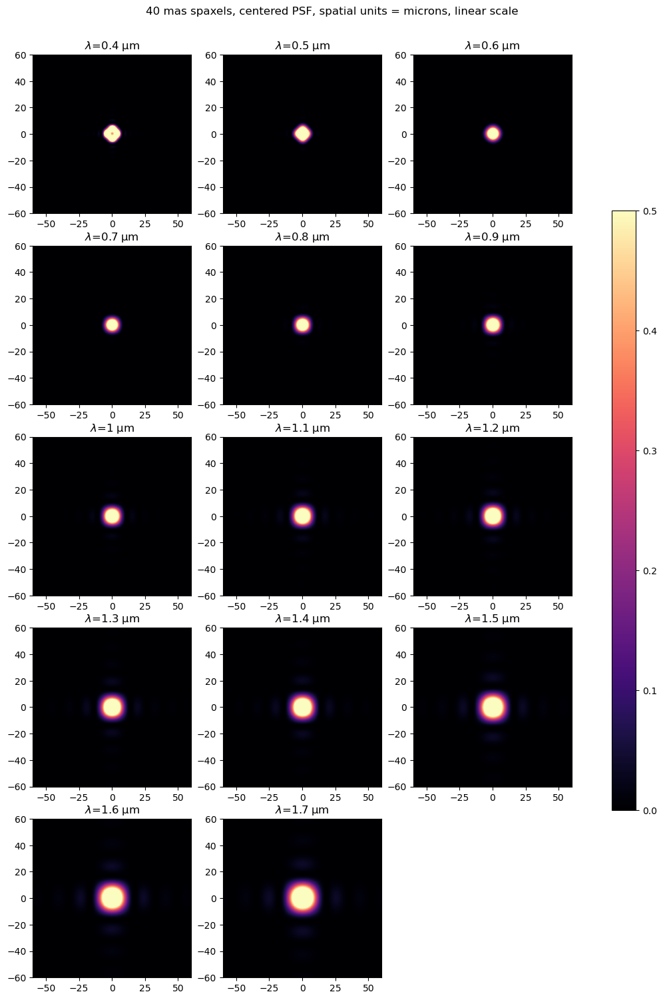

In [17]:
plot_psf_stack(test_lam, psf_stack_40, tigersys_40.m_hw,
               '40 mas spaxels, centered PSF, spatial units = microns, linear scale', logscale=False)

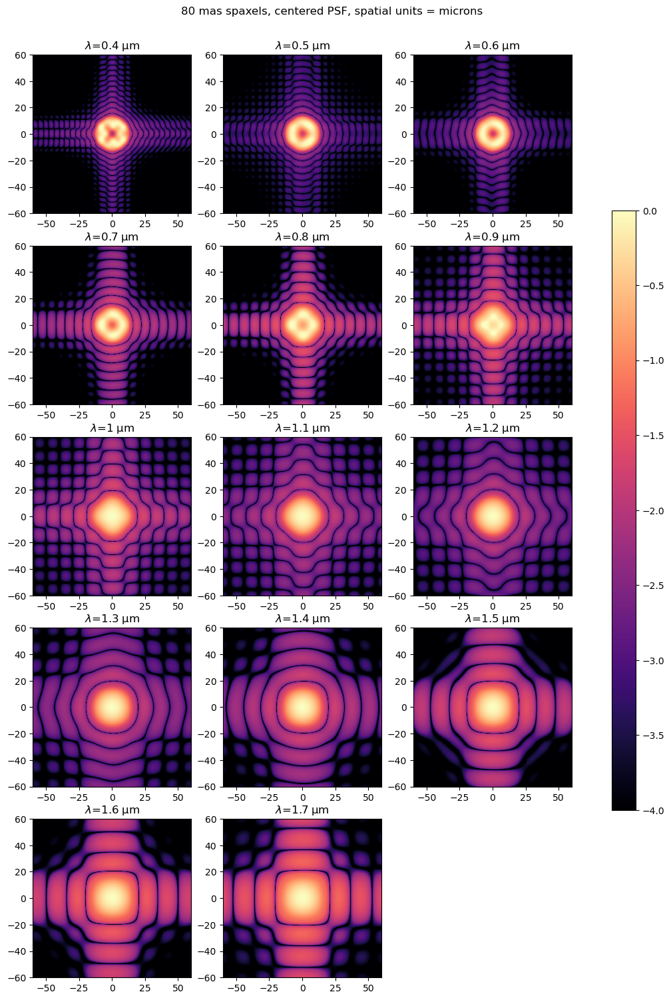

In [18]:
plot_psf_stack(test_lam, psf_stack_80, tigersys_80.m_hw, '80 mas spaxels, centered PSF, spatial units = microns')

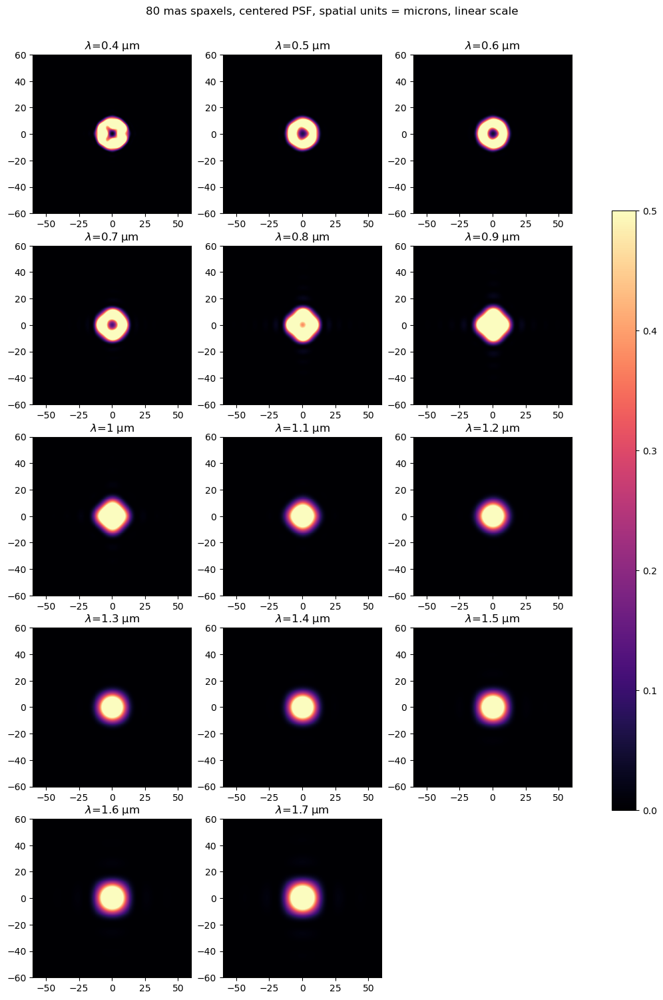

In [19]:
plot_psf_stack(test_lam, psf_stack_80, tigersys_80.m_hw,
               '80 mas spaxels, centered PSF, spatial units = microns, linear scale', logscale=False)

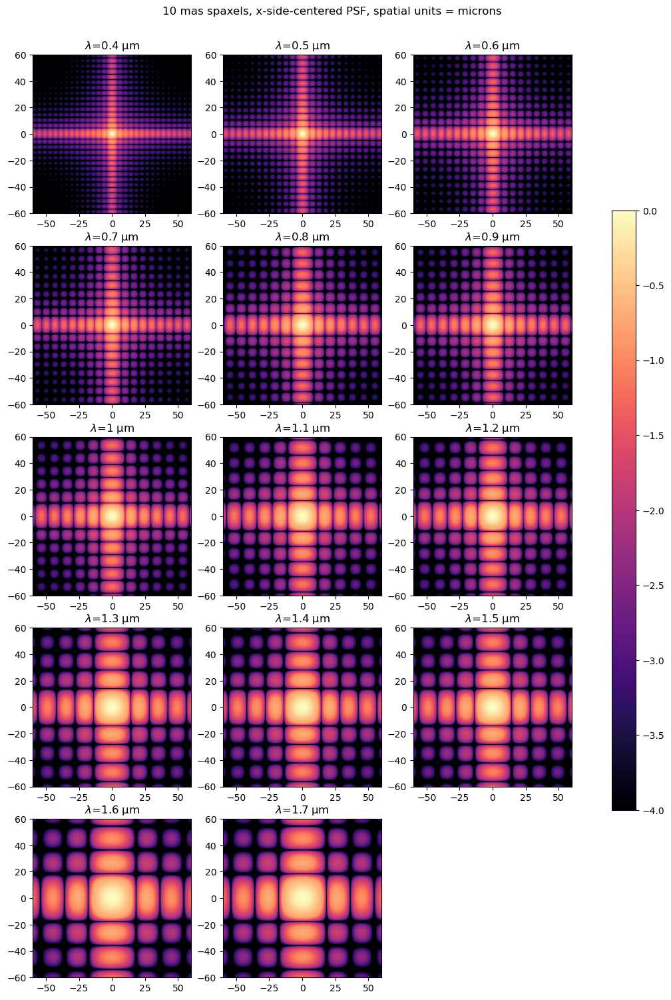

In [20]:
plot_psf_stack(test_lam, psf_stack_10_x, tigersys_10.m_hw,
               '10 mas spaxels, x-side-centered PSF, spatial units = microns')

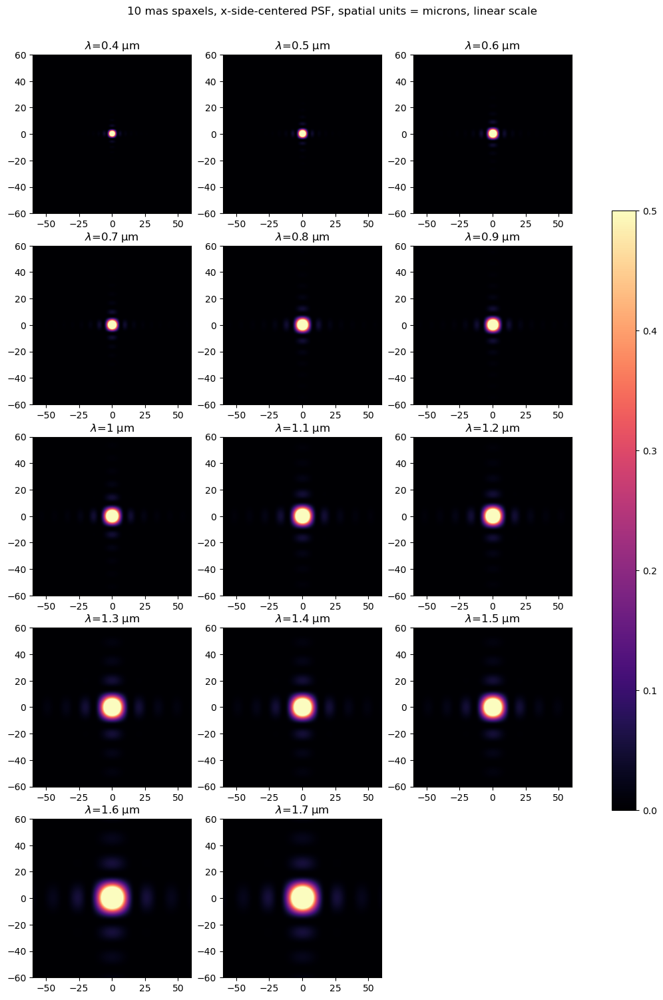

In [23]:
plot_psf_stack(test_lam, psf_stack_10_x, tigersys_10.m_hw,
               '10 mas spaxels, x-side-centered PSF, spatial units = microns, linear scale', logscale=False)

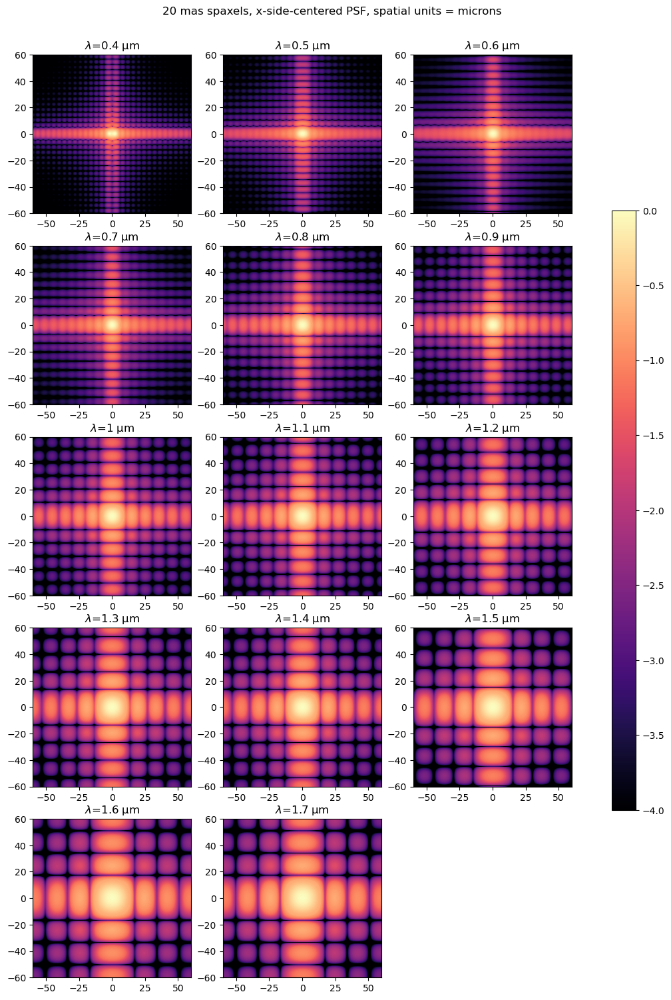

In [24]:
plot_psf_stack(test_lam, psf_stack_20_x, tigersys_20.m_hw,
               '20 mas spaxels, x-side-centered PSF, spatial units = microns')

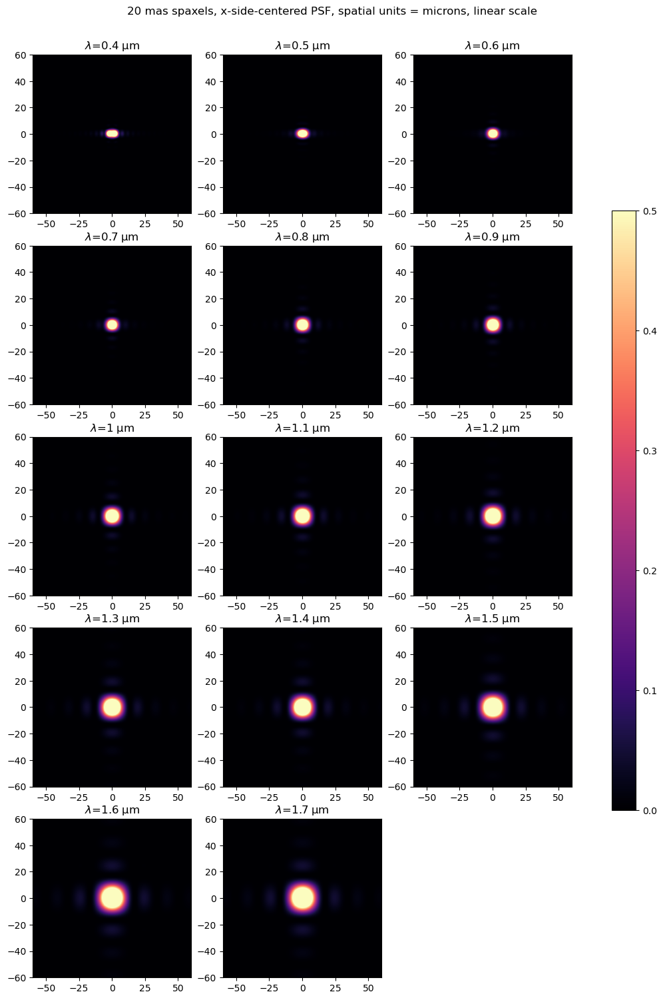

In [25]:
plot_psf_stack(test_lam, psf_stack_20_x, tigersys_20.m_hw,
               '20 mas spaxels, x-side-centered PSF, spatial units = microns, linear scale', logscale=False)

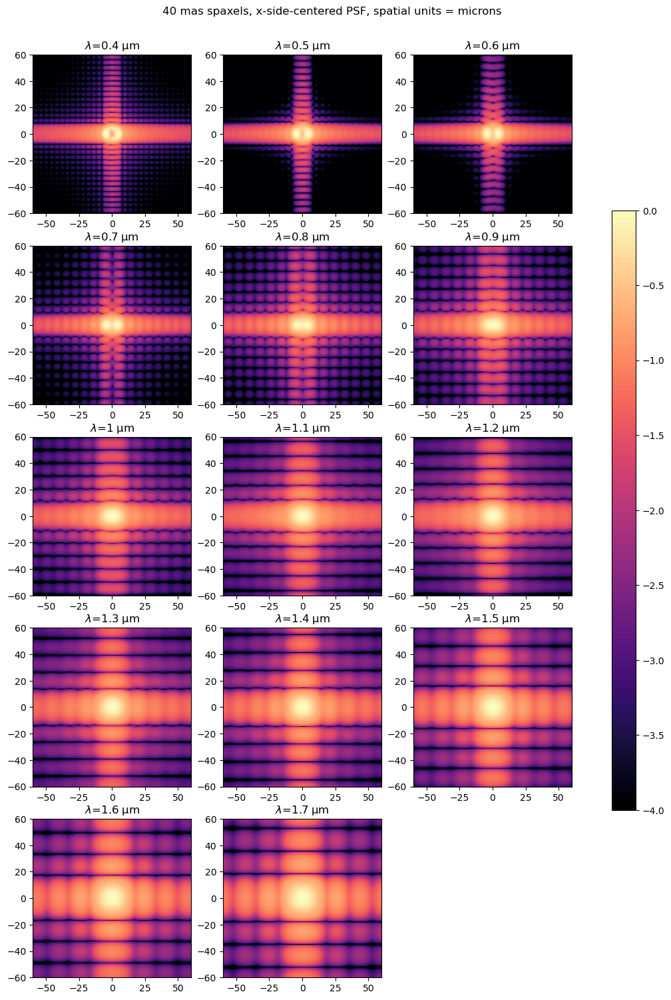

In [187]:
plot_psf_stack(test_lam, psf_stack_40_x, tigersys_40.m_hw, '40 mas spaxels, x-side-centered PSF, spatial units = microns')

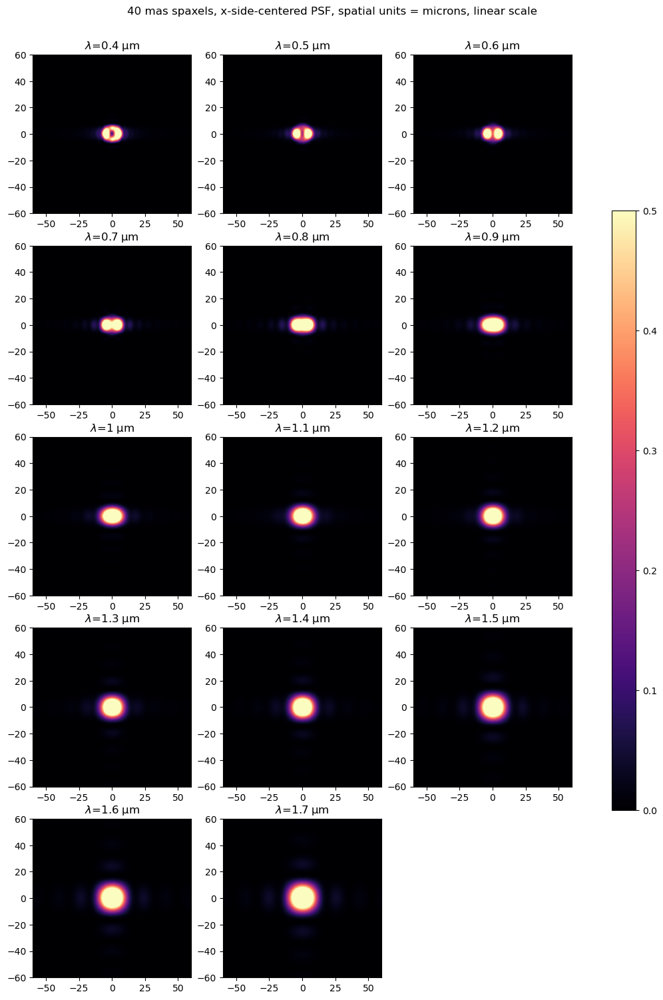

In [26]:
plot_psf_stack(test_lam, psf_stack_40_x, tigersys_40.m_hw,
               '40 mas spaxels, x-side-centered PSF, spatial units = microns, linear scale', logscale=False)

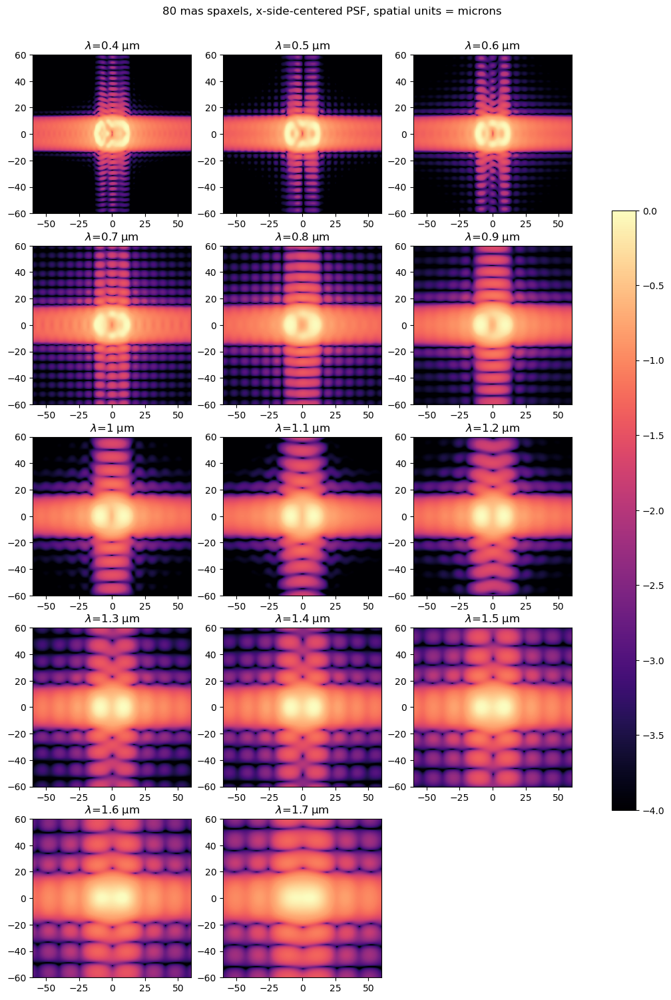

In [27]:
plot_psf_stack(test_lam, psf_stack_80_x, tigersys_80.m_hw,
               '80 mas spaxels, x-side-centered PSF, spatial units = microns')

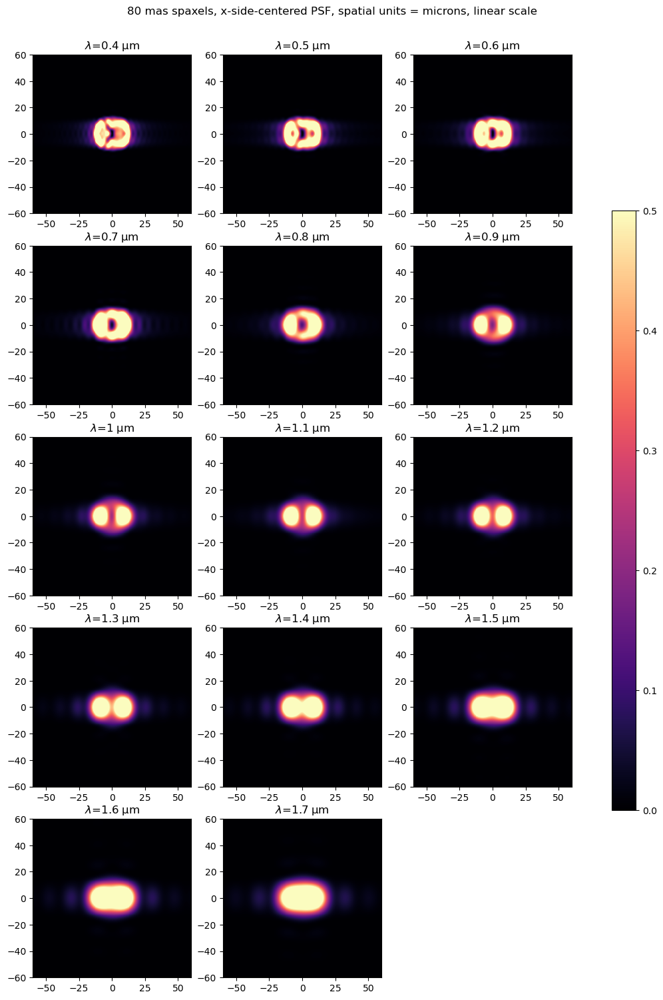

In [28]:
plot_psf_stack(test_lam, psf_stack_80_x, tigersys_80.m_hw,
               '80 mas spaxels, x-side-centered PSF, spatial units = microns, linear scale', logscale=False)

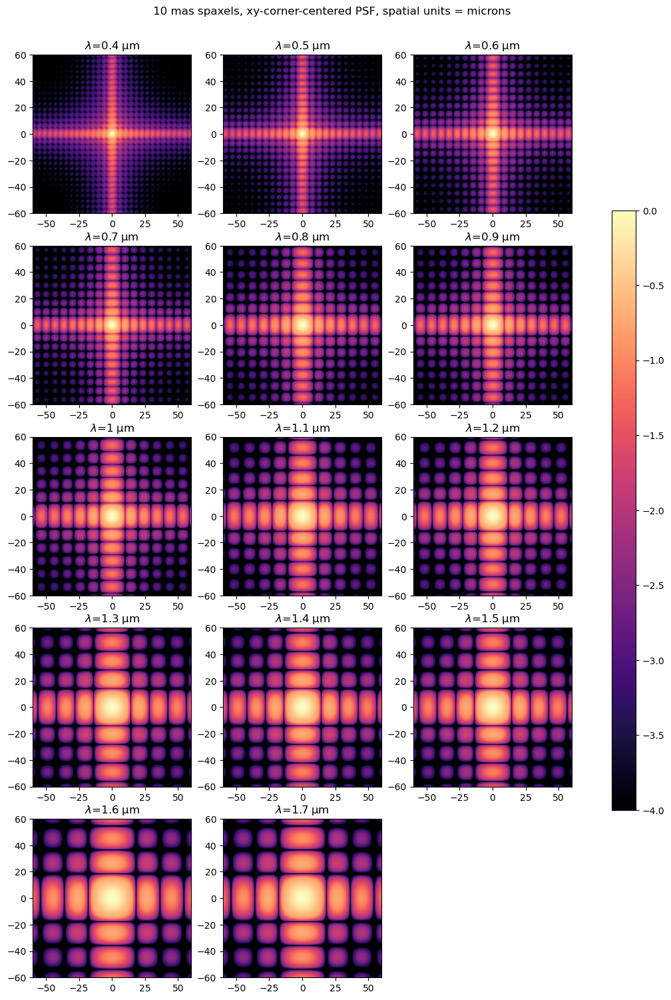

In [29]:
plot_psf_stack(test_lam, psf_stack_10_xy, tigersys_10.m_hw,
               '10 mas spaxels, xy-corner-centered PSF, spatial units = microns')

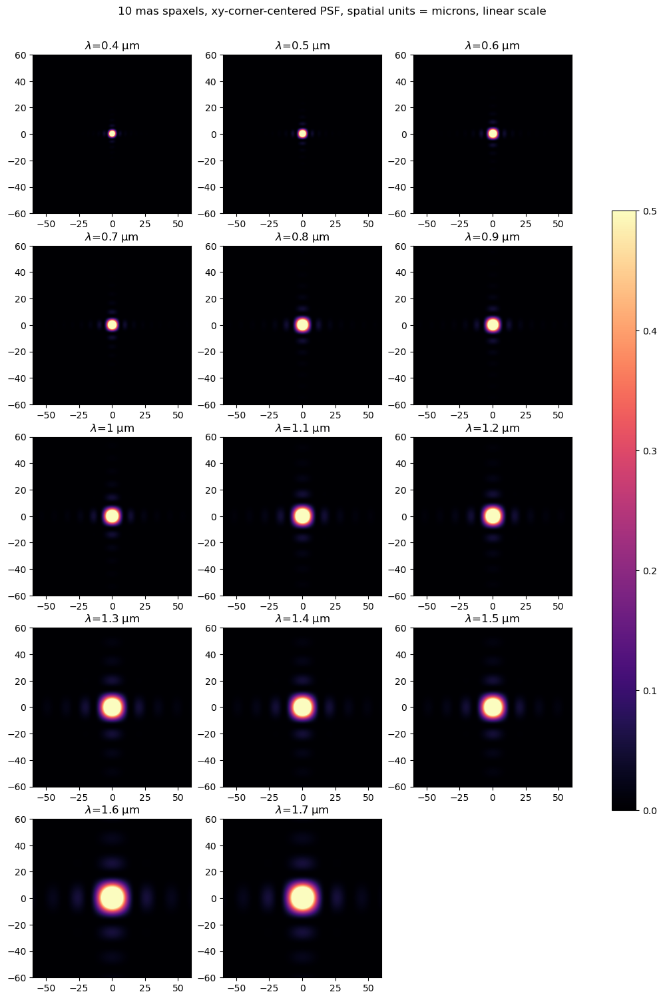

In [30]:
plot_psf_stack(test_lam, psf_stack_10_xy, tigersys_10.m_hw,
               '10 mas spaxels, xy-corner-centered PSF, spatial units = microns, linear scale', logscale=False)

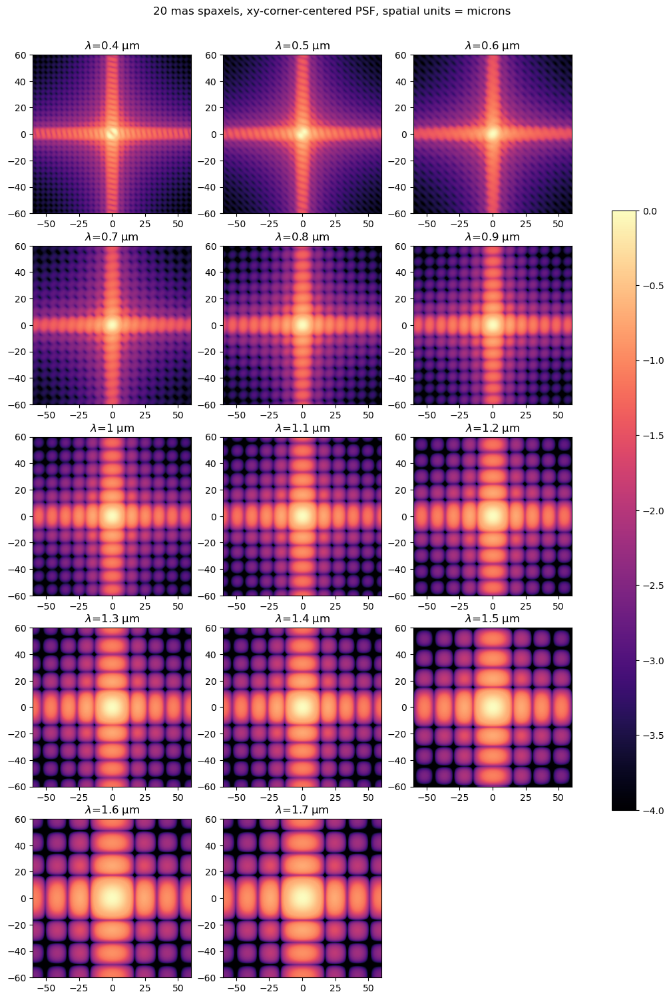

In [31]:
plot_psf_stack(test_lam, psf_stack_20_xy, tigersys_20.m_hw,
               '20 mas spaxels, xy-corner-centered PSF, spatial units = microns')

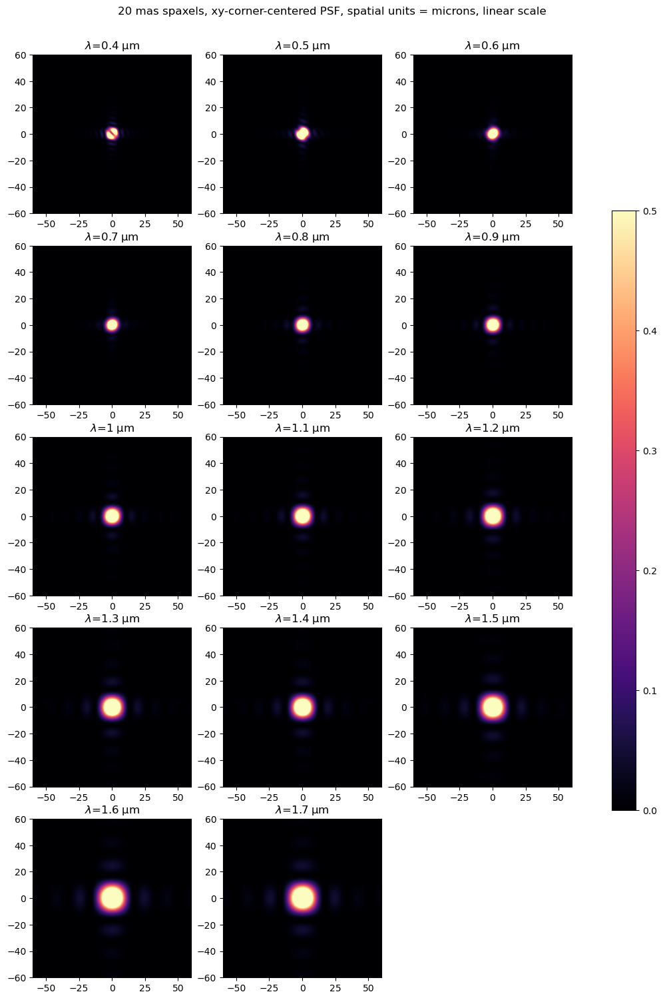

In [32]:
plot_psf_stack(test_lam, psf_stack_20_xy, tigersys_20.m_hw,
               '20 mas spaxels, xy-corner-centered PSF, spatial units = microns, linear scale', logscale=False)

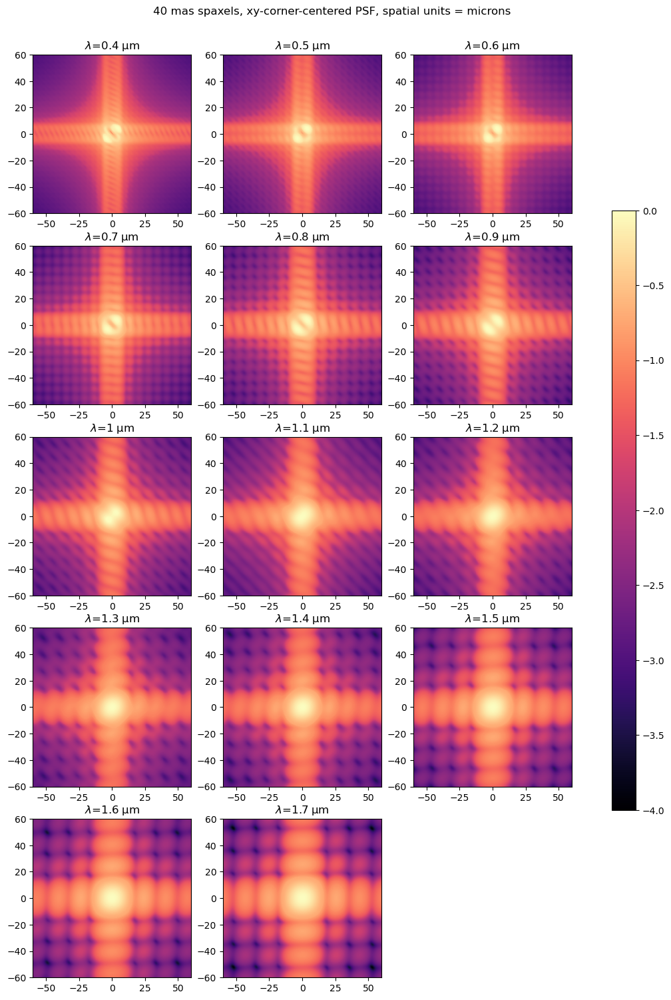

In [33]:
plot_psf_stack(test_lam, psf_stack_40_xy, tigersys_40.m_hw,
               '40 mas spaxels, xy-corner-centered PSF, spatial units = microns')

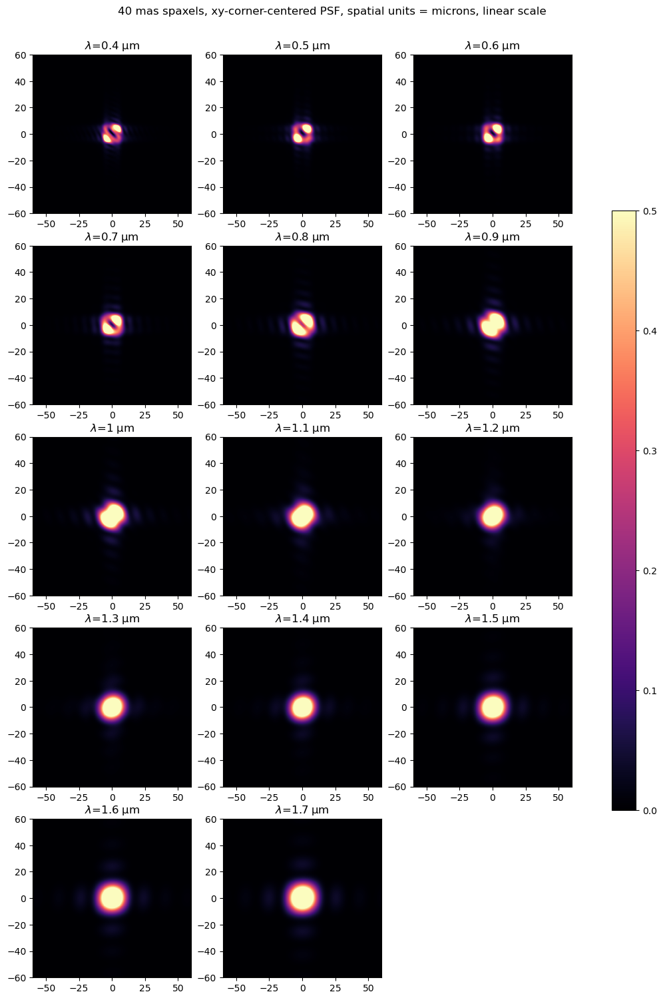

In [34]:
plot_psf_stack(test_lam, psf_stack_40_xy, tigersys_40.m_hw,
               '40 mas spaxels, xy-corner-centered PSF, spatial units = microns, linear scale', logscale=False)

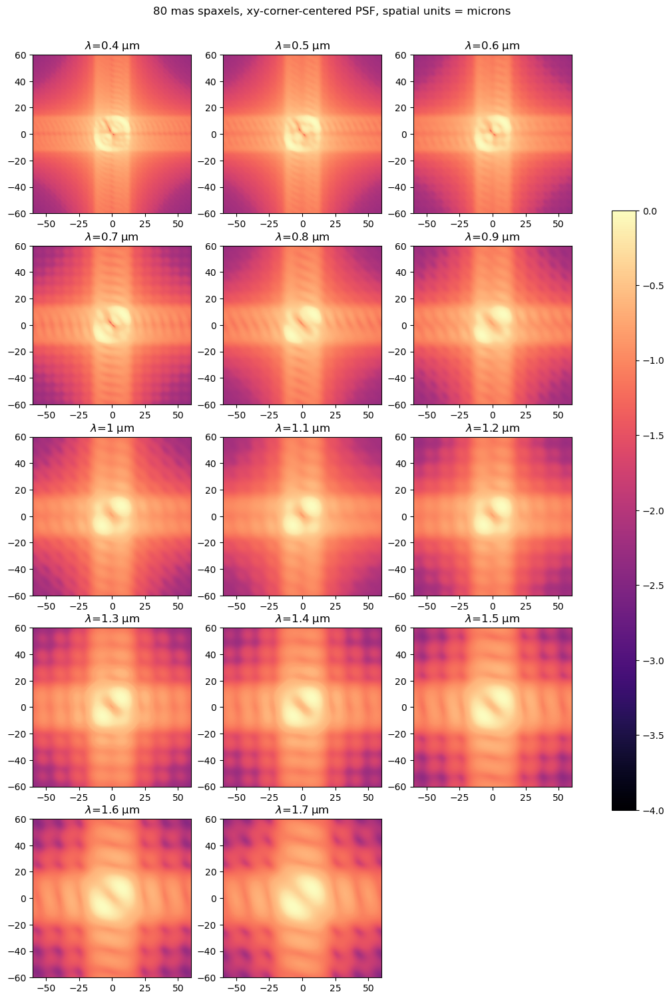

In [35]:
plot_psf_stack(test_lam, psf_stack_80_xy, tigersys_80.m_hw,
               '80 mas spaxels, xy-corner-centered PSF, spatial units = microns')

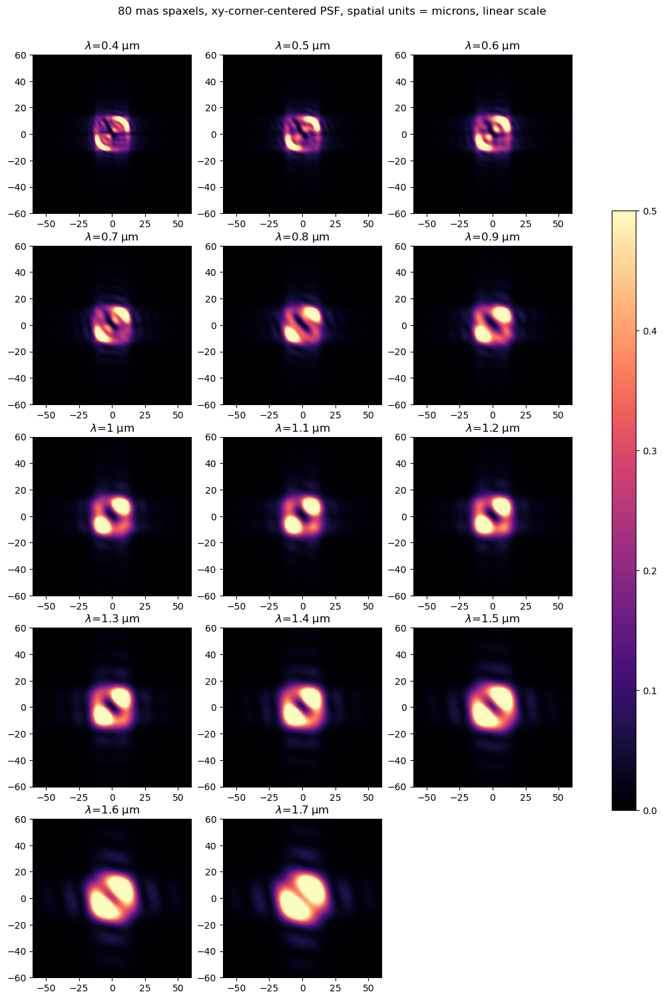

In [36]:
plot_psf_stack(test_lam, psf_stack_80_xy, tigersys_80.m_hw,
               '80 mas spaxels, xy-corner-centered PSF, spatial units = microns, linear scale', logscale=False)

In [55]:
# Calculate ensquared energies at a few wavelengths:
base_10_04u, ensq_10_04u = calc_ensq(psf_stack_10[0].intensity)
base_20_04u, ensq_20_04u = calc_ensq(psf_stack_20[0].intensity)
base_40_04u, ensq_40_04u = calc_ensq(psf_stack_40[0].intensity)
base_80_04u, ensq_80_04u = calc_ensq(psf_stack_80[0].intensity)

base_10_x_04u, ensq_10_x_04u = calc_ensq(psf_stack_10_x[0].intensity)
base_20_x_04u, ensq_20_x_04u = calc_ensq(psf_stack_20_x[0].intensity)
base_40_x_04u, ensq_40_x_04u = calc_ensq(psf_stack_40_x[0].intensity)
base_80_x_04u, ensq_80_x_04u = calc_ensq(psf_stack_80_x[0].intensity)

base_10_xy_04u, ensq_10_xy_04u = calc_ensq(psf_stack_10_xy[0].intensity)
base_20_xy_04u, ensq_20_xy_04u = calc_ensq(psf_stack_20_xy[0].intensity)
base_40_xy_04u, ensq_40_xy_04u = calc_ensq(psf_stack_40_xy[0].intensity)
base_80_xy_04u, ensq_80_xy_04u = calc_ensq(psf_stack_80_xy[0].intensity)

base_10_08u, ensq_10_08u = calc_ensq(psf_stack_10[6].intensity)
base_20_08u, ensq_20_08u = calc_ensq(psf_stack_20[6].intensity)
base_40_08u, ensq_40_08u = calc_ensq(psf_stack_40[6].intensity)
base_80_08u, ensq_80_08u = calc_ensq(psf_stack_80[6].intensity)

base_10_x_08u, ensq_10_x_08u = calc_ensq(psf_stack_10_x[6].intensity)
base_20_x_08u, ensq_20_x_08u = calc_ensq(psf_stack_20_x[6].intensity)
base_40_x_08u, ensq_40_x_08u = calc_ensq(psf_stack_40_x[6].intensity)
base_80_x_08u, ensq_80_x_08u = calc_ensq(psf_stack_80_x[6].intensity)

base_10_xy_08u, ensq_10_xy_08u = calc_ensq(psf_stack_10_xy[6].intensity)
base_20_xy_08u, ensq_20_xy_08u = calc_ensq(psf_stack_20_xy[6].intensity)
base_40_xy_08u, ensq_40_xy_08u = calc_ensq(psf_stack_40_xy[6].intensity)
base_80_xy_08u, ensq_80_xy_08u = calc_ensq(psf_stack_80_xy[6].intensity)

base_10_16u, ensq_10_16u = calc_ensq(psf_stack_10[12].intensity)
base_20_16u, ensq_20_16u = calc_ensq(psf_stack_20[12].intensity)
base_40_16u, ensq_40_16u = calc_ensq(psf_stack_40[12].intensity)
base_80_16u, ensq_80_16u = calc_ensq(psf_stack_80[12].intensity)

base_10_x_16u, ensq_10_x_16u = calc_ensq(psf_stack_10_x[12].intensity)
base_20_x_16u, ensq_20_x_16u = calc_ensq(psf_stack_20_x[12].intensity)
base_40_x_16u, ensq_40_x_16u = calc_ensq(psf_stack_40_x[12].intensity)
base_80_x_16u, ensq_80_x_16u = calc_ensq(psf_stack_80_x[12].intensity)

base_10_xy_16u, ensq_10_xy_16u = calc_ensq(psf_stack_10_xy[12].intensity)
base_20_xy_16u, ensq_20_xy_16u = calc_ensq(psf_stack_20_xy[12].intensity)
base_40_xy_16u, ensq_40_xy_16u = calc_ensq(psf_stack_40_xy[12].intensity)
base_80_xy_16u, ensq_80_xy_16u = calc_ensq(psf_stack_80_xy[12].intensity)

(0.0, 1.0)

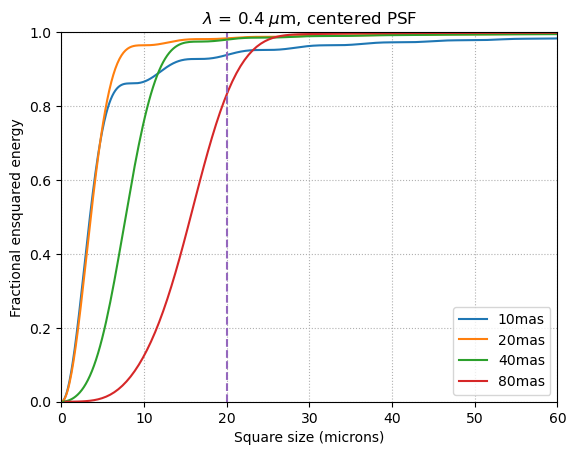

In [56]:
plt.plot((2*tigersys_10.m_hw/(tigersys_10.npix*tigersys_10.oversample))*base_10_04u,
         ensq_10_04u/ensq_10_04u.max(), label='10mas')
plt.plot((2*tigersys_20.m_hw/(tigersys_20.npix*tigersys_20.oversample))*base_20_04u,
         ensq_20_04u/ensq_20_04u.max(), label='20mas')
plt.plot((2*tigersys_40.m_hw/(tigersys_40.npix*tigersys_40.oversample))*base_40_04u,
         ensq_40_04u/ensq_40_04u.max(), label='40mas')
plt.plot((2*tigersys_80.m_hw/(tigersys_80.npix*tigersys_80.oversample))*base_80_04u,
         ensq_80_04u/ensq_80_04u.max(), label='80mas')
plt.grid(linestyle=':')
plt.plot([20,20], [0,1], '--')
plt.legend(loc='lower right')
plt.xlabel('Square size (microns)')
plt.ylabel('Fractional ensquared energy')
plt.title('$\lambda$ = 0.4 $\mu$m, centered PSF')
plt.xlim([0,60])
plt.ylim([0,1])

(0.0, 1.0)

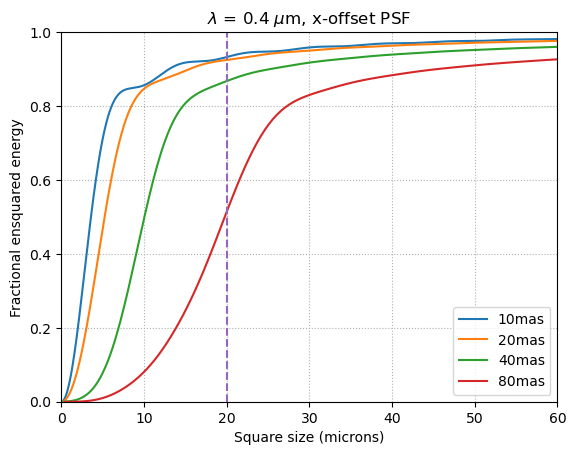

In [57]:
plt.plot((2*tigersys_10.m_hw/(tigersys_10.npix*tigersys_10.oversample))*base_10_x_04u,
         ensq_10_x_04u/ensq_10_x_04u.max(), label='10mas')
plt.plot((2*tigersys_20.m_hw/(tigersys_20.npix*tigersys_20.oversample))*base_20_x_04u,
         ensq_20_x_04u/ensq_20_x_04u.max(), label='20mas')
plt.plot((2*tigersys_40.m_hw/(tigersys_40.npix*tigersys_40.oversample))*base_40_x_04u,
         ensq_40_x_04u/ensq_40_x_04u.max(), label='40mas')
plt.plot((2*tigersys_80.m_hw/(tigersys_80.npix*tigersys_80.oversample))*base_80_x_04u,
         ensq_80_x_04u/ensq_80_x_04u.max(), label='80mas')
plt.grid(linestyle=':')
plt.plot([20,20], [0,1], '--')
plt.legend(loc='lower right')
plt.xlabel('Square size (microns)')
plt.ylabel('Fractional ensquared energy')
plt.title('$\lambda$ = 0.4 $\mu$m, x-offset PSF')
plt.xlim([0,60])
plt.ylim([0,1])

(0.0, 1.0)

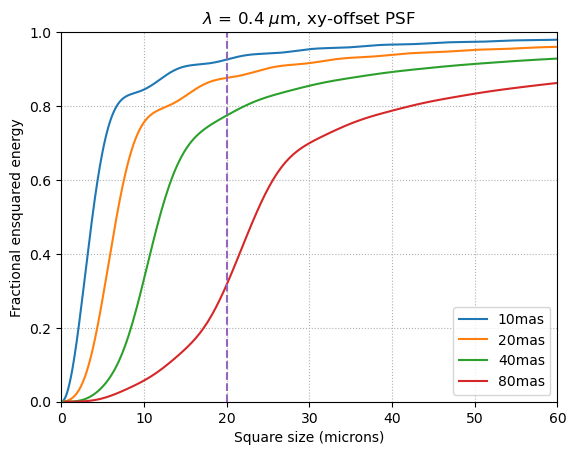

In [58]:
plt.plot((2*tigersys_10.m_hw/(tigersys_10.npix*tigersys_10.oversample))*base_10_xy_04u,
         ensq_10_xy_04u/ensq_10_xy_04u.max(), label='10mas')
plt.plot((2*tigersys_20.m_hw/(tigersys_20.npix*tigersys_20.oversample))*base_20_xy_04u,
         ensq_20_xy_04u/ensq_20_xy_04u.max(), label='20mas')
plt.plot((2*tigersys_40.m_hw/(tigersys_40.npix*tigersys_40.oversample))*base_40_xy_04u,
         ensq_40_xy_04u/ensq_40_xy_04u.max(), label='40mas')
plt.plot((2*tigersys_80.m_hw/(tigersys_80.npix*tigersys_80.oversample))*base_80_xy_04u,
         ensq_80_xy_04u/ensq_80_xy_04u.max(), label='80mas')
plt.grid(linestyle=':')
plt.plot([20,20], [0,1], '--')
plt.legend(loc='lower right')
plt.xlabel('Square size (microns)')
plt.ylabel('Fractional ensquared energy')
plt.title('$\lambda$ = 0.4 $\mu$m, xy-offset PSF')
plt.xlim([0,60])
plt.ylim([0,1])

(0.0, 1.0)

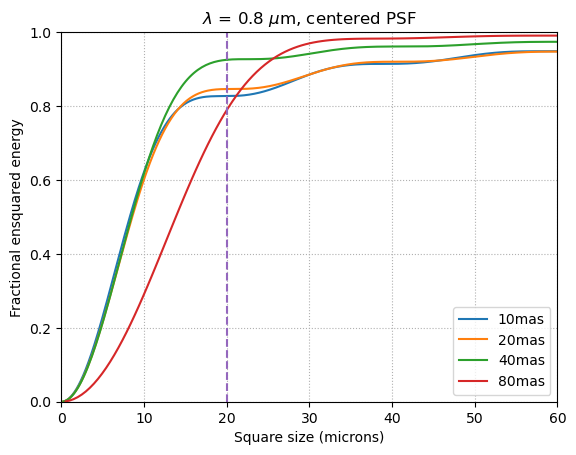

In [59]:
plt.plot((2*tigersys_10.m_hw/(tigersys_10.npix*tigersys_10.oversample))*base_10_08u,
         ensq_10_08u/ensq_10_08u.max(), label='10mas')
plt.plot((2*tigersys_20.m_hw/(tigersys_20.npix*tigersys_20.oversample))*base_20_08u,
         ensq_20_08u/ensq_20_08u.max(), label='20mas')
plt.plot((2*tigersys_40.m_hw/(tigersys_40.npix*tigersys_40.oversample))*base_40_08u,
         ensq_40_08u/ensq_40_08u.max(), label='40mas')
plt.plot((2*tigersys_80.m_hw/(tigersys_80.npix*tigersys_80.oversample))*base_80_08u,
         ensq_80_08u/ensq_80_08u.max(), label='80mas')
plt.grid(linestyle=':')
plt.plot([20,20], [0,1], '--')
plt.legend(loc='lower right')
plt.xlabel('Square size (microns)')
plt.ylabel('Fractional ensquared energy')
plt.title('$\lambda$ = 0.8 $\mu$m, centered PSF')
plt.xlim([0,60])
plt.ylim([0,1])

(0.0, 1.0)

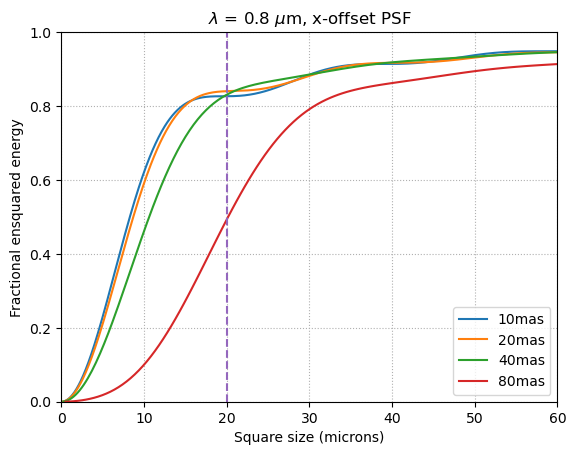

In [60]:
plt.plot((2*tigersys_10.m_hw/(tigersys_10.npix*tigersys_10.oversample))*base_10_x_08u,
         ensq_10_x_08u/ensq_10_x_08u.max(), label='10mas')
plt.plot((2*tigersys_20.m_hw/(tigersys_20.npix*tigersys_20.oversample))*base_20_x_08u,
         ensq_20_x_08u/ensq_20_x_08u.max(), label='20mas')
plt.plot((2*tigersys_40.m_hw/(tigersys_40.npix*tigersys_40.oversample))*base_40_x_08u,
         ensq_40_x_08u/ensq_40_x_08u.max(), label='40mas')
plt.plot((2*tigersys_80.m_hw/(tigersys_80.npix*tigersys_80.oversample))*base_80_x_08u,
         ensq_80_x_08u/ensq_80_x_08u.max(), label='80mas')
plt.grid(linestyle=':')
plt.plot([20,20], [0,1], '--')
plt.legend(loc='lower right')
plt.xlabel('Square size (microns)')
plt.ylabel('Fractional ensquared energy')
plt.title('$\lambda$ = 0.8 $\mu$m, x-offset PSF')
plt.xlim([0,60])
plt.ylim([0,1])

(0.0, 1.0)

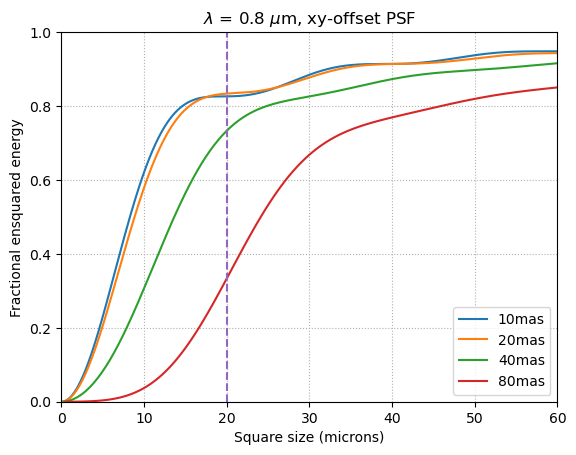

In [61]:
plt.plot((2*tigersys_10.m_hw/(tigersys_10.npix*tigersys_10.oversample))*base_10_xy_08u,
         ensq_10_xy_08u/ensq_10_xy_08u.max(), label='10mas')
plt.plot((2*tigersys_20.m_hw/(tigersys_20.npix*tigersys_20.oversample))*base_20_xy_08u,
         ensq_20_xy_08u/ensq_20_xy_08u.max(), label='20mas')
plt.plot((2*tigersys_40.m_hw/(tigersys_40.npix*tigersys_40.oversample))*base_40_xy_08u,
         ensq_40_xy_08u/ensq_40_xy_08u.max(), label='40mas')
plt.plot((2*tigersys_80.m_hw/(tigersys_80.npix*tigersys_80.oversample))*base_80_xy_08u,
         ensq_80_xy_08u/ensq_80_xy_08u.max(), label='80mas')
plt.grid(linestyle=':')
plt.plot([20,20], [0,1], '--')
plt.legend(loc='lower right')
plt.xlabel('Square size (microns)')
plt.ylabel('Fractional ensquared energy')
plt.title('$\lambda$ = 0.8 $\mu$m, xy-offset PSF')
plt.xlim([0,60])
plt.ylim([0,1])

(0.0, 1.0)

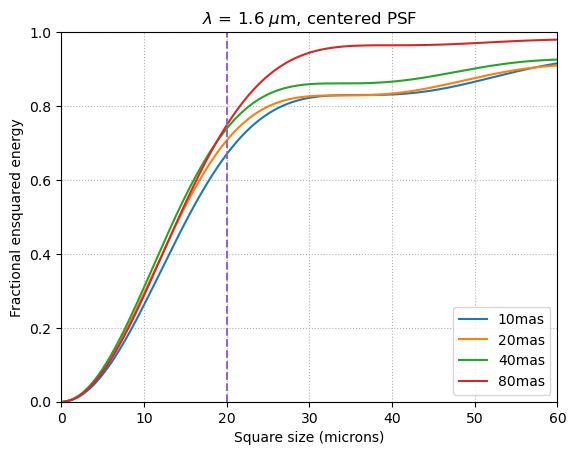

In [62]:
plt.plot((2*tigersys_10.m_hw/(tigersys_10.npix*tigersys_10.oversample))*base_10_16u,
         ensq_10_16u/ensq_10_16u.max(), label='10mas')
plt.plot((2*tigersys_20.m_hw/(tigersys_20.npix*tigersys_20.oversample))*base_20_16u,
         ensq_20_16u/ensq_20_16u.max(), label='20mas')
plt.plot((2*tigersys_40.m_hw/(tigersys_40.npix*tigersys_40.oversample))*base_40_16u,
         ensq_40_16u/ensq_40_16u.max(), label='40mas')
plt.plot((2*tigersys_80.m_hw/(tigersys_80.npix*tigersys_80.oversample))*base_80_16u,
         ensq_80_16u/ensq_80_16u.max(), label='80mas')
plt.grid(linestyle=':')
plt.plot([20,20], [0,1], '--')
plt.legend(loc='lower right')
plt.xlabel('Square size (microns)')
plt.ylabel('Fractional ensquared energy')
plt.title('$\lambda$ = 1.6 $\mu$m, centered PSF')
plt.xlim([0,60])
plt.ylim([0,1])

(0.0, 1.0)

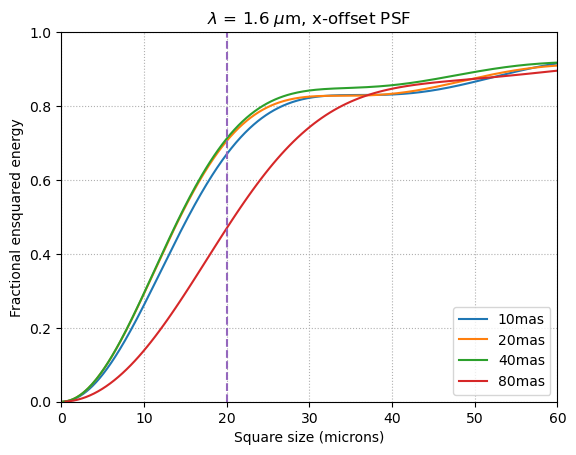

In [63]:
plt.plot((2*tigersys_10.m_hw/(tigersys_10.npix*tigersys_10.oversample))*base_10_x_16u,
         ensq_10_x_16u/ensq_10_x_16u.max(), label='10mas')
plt.plot((2*tigersys_20.m_hw/(tigersys_20.npix*tigersys_20.oversample))*base_20_x_16u,
         ensq_20_x_16u/ensq_20_x_16u.max(), label='20mas')
plt.plot((2*tigersys_40.m_hw/(tigersys_40.npix*tigersys_40.oversample))*base_40_x_16u,
         ensq_40_x_16u/ensq_40_x_16u.max(), label='40mas')
plt.plot((2*tigersys_80.m_hw/(tigersys_80.npix*tigersys_80.oversample))*base_80_x_16u,
         ensq_80_x_16u/ensq_80_x_16u.max(), label='80mas')
plt.grid(linestyle=':')
plt.plot([20,20], [0,1], '--')
plt.legend(loc='lower right')
plt.xlabel('Square size (microns)')
plt.ylabel('Fractional ensquared energy')
plt.title('$\lambda$ = 1.6 $\mu$m, x-offset PSF')
plt.xlim([0,60])
plt.ylim([0,1])

(0.0, 1.0)

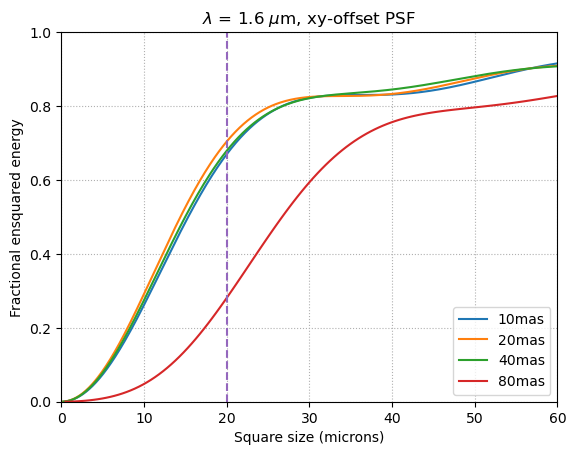

In [64]:
plt.plot((2*tigersys_10.m_hw/(tigersys_10.npix*tigersys_10.oversample))*base_10_xy_16u,
         ensq_10_xy_16u/ensq_10_xy_16u.max(), label='10mas')
plt.plot((2*tigersys_20.m_hw/(tigersys_20.npix*tigersys_20.oversample))*base_20_xy_16u,
         ensq_20_xy_16u/ensq_20_xy_16u.max(), label='20mas')
plt.plot((2*tigersys_40.m_hw/(tigersys_40.npix*tigersys_40.oversample))*base_40_xy_16u,
         ensq_40_xy_16u/ensq_40_xy_16u.max(), label='40mas')
plt.plot((2*tigersys_80.m_hw/(tigersys_80.npix*tigersys_80.oversample))*base_80_xy_16u,
         ensq_80_xy_16u/ensq_80_xy_16u.max(), label='80mas')
plt.grid(linestyle=':')
plt.plot([20,20], [0,1], '--')
plt.legend(loc='lower right')
plt.xlabel('Square size (microns)')
plt.ylabel('Fractional ensquared energy')
plt.title('$\lambda$ = 1.6 $\mu$m, xy-offset PSF')
plt.xlim([0,60])
plt.ylim([0,1])